In [1]:
import os
import yaml
import torch
from tqdm import tqdm

os.chdir('..')
from inference.utils import *
from core.utils import load_or_fail
from train import WurstCoreC, WurstCoreB

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


### Load Config

In [13]:
# SETUP STAGE C
config_file = 'configs/inference/stage_c_3b.yaml'
with open(config_file, "r", encoding="utf-8") as file:
    loaded_config = yaml.safe_load(file)

core = WurstCoreC(config_dict=loaded_config, device=device, training=False)

# SETUP STAGE B
config_file_b = 'configs/inference/stage_b_3b.yaml'
with open(config_file_b, "r", encoding="utf-8") as file:
    config_file_b = yaml.safe_load(file)
    
core_b = WurstCoreB(config_dict=config_file_b, device=device, training=False)

['model_version', 'effnet_checkpoint_path', 'previewer_checkpoint_path']
['model_version', 'stage_a_checkpoint_path', 'effnet_checkpoint_path']


### Load Extras & Models

In [14]:
# SETUP MODELS & DATA
extras = core.setup_extras_pre()
models = core.setup_models(extras)
models.generator.eval().requires_grad_(False)
print("STAGE C READY")

extras_b = core_b.setup_extras_pre()
models_b = core_b.setup_models(extras_b, skip_clip=True)
models_b = WurstCoreB.Models(
   **{**models_b.to_dict(), 'tokenizer': models.tokenizer, 'text_model': models.text_model}
)
models_b.generator.bfloat16().eval().requires_grad_(False)
print("STAGE B READY")

['transforms', 'clip_preprocess', 'gdf', 'sampling_configs', 'effnet_preprocess']


tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.88k [00:00<?, ?B/s]

pytorch_model.bin.index.json:   0%|          | 0.00/120k [00:00<?, ?B/s]

pytorch_model-00001-of-00002.bin:   0%|          | 0.00/9.99G [00:00<?, ?B/s]

pytorch_model-00002-of-00002.bin:   0%|          | 0.00/169M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

['tokenizer', 'text_model', 'generator', 'effnet', 'previewer']
STAGE C READY
['transforms', 'clip_preprocess', 'gdf', 'sampling_configs', 'effnet_preprocess']
['tokenizer', 'text_model', 'generator', 'effnet', 'stage_a']
['tokenizer', 'text_model', 'generator', 'effnet', 'stage_a']
STAGE B READY


### Optional: Compile Stage C and Stage B

**Note**: This will increase speed inference by about 2x, but will initially take a few minutes to compile. Moreover, currently using `torch.compile` only works for a single image resolution, e.g. 1024 x 1024. If you use a different size, it will recompile. See more [here](https://pytorch.org/tutorials/intermediate/torch_compile_tutorial.html).

In [ ]:
models = WurstCoreC.Models(
   **{**models.to_dict(), 'generator': torch.compile(models.generator, mode="reduce-overhead", fullgraph=True)}
)

models_b = WurstCoreB.Models(
   **{**models_b.to_dict(), 'generator': torch.compile(models_b.generator, mode="reduce-overhead", fullgraph=True)}
)

## Text-to-Image

In [29]:
artists = ['A.J.Casson',
'Abbott Fuller Graves',
'Abbott Handerson Thayer',
'Abram Efimovich Arkhipov',
'Adrianus Eversen',
'Agnes Cecile',
'Agostino Arrivabene',
'Ai Weiwei',
'Akira Toriyama',
'Alan Bean',
'Alan Lee',
'Alasdair McLellan',
'Albert Bierstadt',
'Albert Edelfelt',
'Albert Goodwin',
'Albert Lynch',
'Alberto Seveso',
'Albrecht Anker',
'Albrecht Durer',
'Alejandro Burdisio',
'Alena Aenami',
'Alessandro Allori',
'Alessio Albi',
'Alex Alemany',
'Alex Andreev',
'Alex Colville',
'Alex Grey',
'Alex Gross',
'Alex Ross',
'Alexander Archipenko',
'Alexander Averin',
'Alexander Jansson',
'Alexander McQueen',
'Alexandre Cabanel',
'Alexandre Calame',
'Alfons Mucha',
'Alfred Cheney Johnston',
'Alfred Eisenstaedt',
'Alfred Stevens',
'Alice Neel',
'Alois Arnegger',
'Alvar Aalto',
'Alyssa Monks',
'Amanda Clark',
'Amedeo Modigliani',
'Amy Judd',
'Anders Zorn',
'Andre Derain',
'Andre Kohn',
'Andrea Kowch',
'Andrea Mantegna',
'Andreas Achenbach',
'Andreas Franke',
'Andrew Atroshenko',
'Andrew Macara',
'Andrew Wyeth',
'Andrey Remnev',
'Andy Kehoe',
'Andy Warhol',
'Anka Zhuravleva',
'Anna Ancher',
'Anna Dittmann',
'Anne Stokes',
'Anni Albers',
'Ansel Adams',
'Anthony van Dyck',
'Antoine Blanchard',
'Anton Fadeev',
'Anton Mauve',
'Anton Pieck',
'Antonello da Messina',
'Antonio Mora',
'Archibald Thorburn',
'Archillect',
'Arkhip Kuindzhi',
'Armand Guillaumin',
'Arnold Böcklin',
'Arseniy Chebynkin',
'Artgerm',
'Arthur Adams',
'Arthur Hacker',
'Arthur Hughes',
'Arthur Rackham',
'Arthur Streeton',
'Arthur Wardle',
'Asher Brown Durand',
'Atey Ghailan',
'Audrey Kawasaki',
'August Macke',
'August Sander',
'Auguste Toulmouche',
'Balthus',
'Banksy',
'Bastien Lecouffe-Deharme',
'Beatrix Potter',
'Beeple',
'Bella Kotak',
'Ben Aronson',
'Bernardo Bellotto',
'Bert Stern',
'Berthe Morisot',
'Bill Gekas',
'Bjarke Ingels',
'Bo Bartlett',
'Bob Byerley',
'Boris Kustodiev',
'Boris Vallejo',
'Botero',
'Brad Kunkle',
'Brent Heighton',
'Briton Rivière',
'Brooke Shaden',
'Brothers Grimm',
'Bruce Pennington',
'Camille Corot',
'Canaletto',
'Carl Holsoe',
'Carl Larsson',
'Carl Spitzweg',
'Carlo Crivelli',
'Carne Griffiths',
'Caspar David Friedrich',
'Catrin Welz-Stein',
'Charles Addams',
'Charles Angrand',
'Charles Spencelayh',
'Charles-Francois Daubigny',
'Charlie Bowater',
'Chiho Aoshima',
'Chris Foss',
'Chuck Close',
'Cicely Mary Barker',
'Cindy Sherman',
'Clemens Ascher',
'Cory Arcangel',
'Craigie Aitchison',
'Cuno Amiet',
'Daido Moriyama',
'Daniel Arsham',
'Daniel Garber',
'Daniel Ridgway Knight',
'Dante Gabriel Rossetti',
'Darek Zabrocki',
'Dariusz Zawadzki',
'Darrell K. Sweet',
'David Aja',
'David Bowie',
'David Hockney',
'David Teniers the Younger',
'Dean Ellis',
'Denis Sarazhin',
'Diane Arbus',
'Diego Velázquez',
'Dorina Costras',
'Doug Aitken',
'Duy Huynh',
'Ed Freeman',
'Ed Mell',
'Edgar Degas',
'Edmund Dulac',
'Edmund Leighton',
'Edvard Munch',
'Edward Burne-Jones',
'Edward Hopper',
'Edward John Poynter',
'Edward Lear',
'Edward Robert Hughes',
'Edward Steichen',
'Edward Weston',
'Edwin Austin Abbey',
'Egon Schiele',
'Eileen Agar',
'El Anatsui',
'El Greco',
'El Huervo',
'Élisabeth Vigée Le Brun',
'Emil Alzamora',
'Emil Melmoth',
'Eric Zener',
'Ernst Fuchs',
'Ernst Ludwig Kirchner',
'Esao Andrews',
'Etel Adnan',
'Eugène Atget',
'Eugene Delacroix',
'Eve Arnold',
'Evelyn De Morgan',
'Eyvind Earle',
'Federico Pelat',
'Ferdinand Hodler',
'Fernando Amorsolo',
'Floris Arntzenius',
'Ford Madox Brown',
'Fra Angelico',
'Francisco De Goya',
'Frank Auerbach',
'Frank Frazetta',
'Frank Lloyd Wright',
'Franz Xaver Winterhalter',
'Frederic Edwin Church',
'Frederic Remington',
'Genndy Tartakovsky',
'George Ault',
'George Frederic Watts',
'George Inness',
'George Lucas',
'Georges Seurat',
'Georgia O Keeffe',
'Gerald Brom',
'Gerd Arntz',
'Gertrude Abercrombie',
'Ghada Amer',
'Gil Elvgren',
'Gilbert Stuart',
'Giorgio de Chirico',
'Giovani Magana',
'Giuseppe Arcimboldo',
'Gjon Mili',
'Gordon Parks',
'Grant Wood',
'Greg Rutkowski',
'Gregory Crewdson',
'Grzegorz Rosiński',
'Gustav Klimt',
'Gustave Doré',
'Gustave Moreau',
'Guy Aroch',
'H.P. Lovecraft',
'H.R. Giger',
'Hans Christian Andersen',
'Hasui Kawase',
'Hayao Miyazaki',
'Hayashida Q',
'Helen Allingham',
'Helmut Newton',
'Hendrick Avercamp',
'Henri De Toulouse Lautrec',
'Henri Fantin Latour',
'Henri Matisse',
'Henri Rousseau',
'Henri-Edmond Cross',
'Henry Asencio',
'Henry Ossawa Tanner',
'Hilma af Klint',
'Hirohiko Araki',
'Hiroshi Yoshida',
'Horace Vernet',
'Howard Arkley',
'Hsiao-Ron Cheng',
'Hubert Robert',
'Igor Zenin',
'Ilya Kuvshinov',
'Ilya Repin',
'Inio Asano',
'Inoue Takehiko',
'Isaac Levitan',
'Italo Calvino',
'Ivan Aivazovsky',
'Ivan Albright',
'Ivan Bilibin',
'Ivan Shishkin',
'J.C. Leyendecker',
'Jacek Yerka',
'Jacob Lawrence',
'Jacques-Laurent Agasse',
'Jakub Rozalski',
'James Gilleard',
'James Gurney',
'James Paick',
'James Turrell',
'Jan Matejko',
'Jan Urschel',
'Jan Van Eyck',
'Janek Sedlar',
'Jay Anacleto',
'Jean Arp',
'Jean Auguste Dominique Ingres',
'Jean Giraud',
'Jean Marc Nattier',
'Jean-Baptiste Monge',
'Jean-François Millet',
'Jean-Honoré Fragonard',
'Jean-Léon Gérôme',
'Jeremy Geddes',
'Jeremy Lipking',
'Jeremy Mann',
'Jesper Ejsing',
'Jessie Willcox Smith',
'Jim Burns',
'Jimmy Lawlor',
'Joaquín Sorolla',
'Johannes Vermeer',
'John Blanche',
'John Constable',
'John Harris',
'John Howe',
'John James Audubon',
'John Lavery',
'John Martin',
'John Singer Sargent',
'John Singleton Copley',
'John White Alexander',
'John Wilhelm',
'John William Waterhouse',
'Jordan Grimmer',
'Josan Gonzalez',
'Josef Albers',
'Joseph Mallord William Turner',
'Josephine Wall',
'Josh Adamski',
'Josh Kirby',
'Jovana Rikalo',
'Jules Bastien-Lepage',
'Julian Falat',
'Junji Ito',
'Justin Gerard',
'Kadir Nelson',
'Katsushika Hokusai',
'Katsuyuki Nishijima',
'Kehinde Wiley',
'Keith Parkinson',
'Kengo Kuma',
'Kevin Sloan',
'Kitagawa Utamaro',
'Kousuke Kurose',
'Koyoharu Gotouge',
'Kunisada',
'Larry Rivers',
'Lawren Harris',
'Lawrence Alma-Tadema',
'Lee Madgwick',
'Leonardo Da Vinci',
'Leonid Afremov',
'Lilia Alvarado',
'liquidcoco李奎德',
'Louis Anquetin',
'Louis Comfort Tiffany',
'Louise Dahl-Wolfe',
'Lovis Corinth',
'Lucas Cranach the Elder',
'Lucian Freud',
'Luis Royo',
'M.C. Escher',
'Maciej Rebisz',
'Magali Villeneuve',
'Makoto Shinkai',
'Malcolm Liepke',
'Man Ray',
'Mandy Disher',
'Marc Chagall',
'Marc Simonetti',
'Marianne North',
'Marina Abramović',
'Mariusz Lewandowski',
'Mark Arian',
'Mark Keathley',
'Mark Ryden',
'Mark Seliger',
'Markus Vogt',
'Martin Ansin',
'Martin Johnson Heade',
'Mary Anning',
'Mary Cassatt',
'Mary Jane Ansell',
'Mattias Adolfsson',
'Max Bedulenko',
'Max Ernst',
'Maxfield Parrish',
'Maximilien Luce',
'Maya Takamura',
'Michael Ancher',
'Michael Cheval',
'Michael Parkes',
'Michael Whelan',
'Michal Karcz',
'Michelangelo Buonarroti',
'Miho Hirano',
'Mikalojus Ciurlionis',
'Mike Allred',
'Mike Mignola',
'Miki Asai',
'Mikko Lagerstedt',
'Miles Aldridge',
'Milton Avery',
'Miss Aniela',
'Mordecai Ardon',
'Mort Kunstler',
'Naoki Urasawa',
'Nathan Wirth',
'Neal Adams',
'Nicholas Roerich',
'Nick Alm',
'Nobuyoshi Araki',
'Norman Ackroyd',
'Norman Rockwell',
'Ohara Koson',
'Oleg Oprisco',
'Oleksiy Rysyuk',
'Owlturd',
'Pablo Picasso',
'Paolo Roversi',
'Pascal Blanché',
'Patrice Murciano',
'Paul Cadmus',
'Paul Delvaux',
'Paul Signac',
'Paul Strand',
'Peder Severin Krøyer',
'Peter Elson',
'Peter Holme III',
'Peter Mohrbacher',
'Peter Paul Rubens',
'Peter Wileman',
'Piet Mondrian',
'Pieter Aertsen',
'PiNe(パイネ)',
'Pixar',
'Rafael Albuquerque',
'Ralph McQuarrie',
'Ramon Casas',
'Raphael Lacoste',
'Rashad Alakbarov',
'Rembrandt Van Rijn',
'René Magritte',
'RHADS',
'Richard Anderson',
'Richard S. Johnson',
'Rick Amor',
'Robert Hagan',
'Robert Henri',
'Robert Mcginnis',
'Robert Rauschenberg',
'Rockwell Kent',
'Roger Dean',
'Rolf Armstrong',
'Ron Arad',
'Ross Tran',
'Russ Mills',
'Sabbas Apterus',
'Sailor Moon',
'Sally Mann',
'Salvador Dali',
'Sandro Botticelli',
'Sarah Andersen',
'Sarah McCulloch',
'Scott Listfield',
'Scott Naismith',
'Sebastian Luca',
'Sergio Aragonés',
'Shepard Fairey',
'Sherree Valentine Daines',
'Sherry Akrami',
'Shinji Aramaki',
'Simon Stålenhag',
'Slim Aarons',
'Sofonisba Anguissola',
'Sophie Anderson',
'Sparth',
'Stan Lee',
'Stephen Hickman',
'Steve Argyle',
'Steven Belledin',
'Studio Ghibli',
'Studio Trigger',
'Suguru Tanaka',
'Sui Ishida',
'Svetlin Velinov',
'Syd Mead',
'Sylvain Sarrailh',
'Tadao Ando',
'teamLab',
'Ted Nasmith',
'Terada Katsuya',
'Terry Redlin',
'Tex Avery',
'Theo van Rysselberghe',
'Thomas Benjamin Kennington',
'Thomas Eakins',
'Thomas Gainsborough',
'Thomas Kinkade',
'Thomas W Schaller',
'Tim Burton',
'Timothy Jack',
'Tintoretto',
'Titian',
'Tom Bagshaw',
'Tom Roberts',
'Tom Thomson',
'Tomma Abts',
'Tooth Wu',
'Tsutomu Nihei',
'Tuomas Korpi',
'Tyler Edlin',
'Utagawa Hiroshige',
'ValheIm Hammershøi',
'Van Gogh',
'Victo Ngai',
'Victor Adame Minguez',
'Vito Acconci',
'Vittorio Matteo Corcos',
'Vivian Maier',
'Vladimir Kush',
'Walter Crane',
'Walter Langley',
'Wassily Kandinsky',
'Wayne Barlowe',
'Wes Anderson',
'William Blake',
'William Holman Hunt',
'William Morris',
'Winslow Homer',
'WLOP',
'Wojciech Siudmak',
'Worthington Whittredge',
'Yaacov Agam',
'Yayoi Kusama',
'Yoji Shinkawa',
'Yoshitaka Amano',
'Yuumei',
'Zdzisław Beksiński']

In [ ]:
from PIL import Image
import torchvision.transforms as transforms

batch_size = 1

for artist in artists:
    caption = f"A cliff castle, painting by {artist}"
    
    height, width = 1024, 1024
    stage_c_latent_shape, stage_b_latent_shape = calculate_latent_sizes(height, width, batch_size=batch_size)
    
    # Stage C Parameters
    extras.sampling_configs['cfg'] = 4
    extras.sampling_configs['shift'] = 2
    extras.sampling_configs['timesteps'] = 20
    extras.sampling_configs['t_start'] = 1.0
    
    # Stage B Parameters
    extras_b.sampling_configs['cfg'] = 1.1
    extras_b.sampling_configs['shift'] = 1
    extras_b.sampling_configs['timesteps'] = 10
    extras_b.sampling_configs['t_start'] = 1.0
    
    # PREPARE CONDITIONS
    batch = {'captions': [caption] * batch_size}
    conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False, eval_image_embeds=False)
    unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True, eval_image_embeds=False)    
    conditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=False)
    unconditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=True)
    
    with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
        # torch.manual_seed(42)
    
        sampling_c = extras.gdf.sample(
            models.generator, conditions, stage_c_latent_shape,
            unconditions, device=device, **extras.sampling_configs,
        )
        for (sampled_c, _, _) in tqdm(sampling_c, total=extras.sampling_configs['timesteps']):
            sampled_c = sampled_c
            
        # preview_c = models.previewer(sampled_c).float()
        # show_images(preview_c)
    
        conditions_b['effnet'] = sampled_c
        unconditions_b['effnet'] = torch.zeros_like(sampled_c)
    
        sampling_b = extras_b.gdf.sample(
            models_b.generator, conditions_b, stage_b_latent_shape,
            unconditions_b, device=device, **extras_b.sampling_configs
        )
        for (sampled_b, _, _) in tqdm(sampling_b, total=extras_b.sampling_configs['timesteps']):
            sampled_b = sampled_b
        sampled = models_b.stage_a.decode(sampled_b).float()
    
    show_images(sampled)
    
    def tensor_to_pil(tensor):
        # In case your tensor is on a GPU, you need to move it to CPU memory
        tensor = tensor.to('cpu')
        
        # If your tensor is in the range [0, 1], you should unnormalize it to [0, 255]
        # If it's already in [0, 255], you can comment out the line below
        tensor = tensor * 255
        
        # Clamp the values to be in the range [0, 255] and convert to uint8
        tensor = tensor.clamp(0, 255).byte()
        
        # Convert tensor to PIL Image
        pil_image = transforms.ToPILImage()(tensor)
        return pil_image
    
    # Assuming `sampled` is a batch of image tensors with shape [N, C, H, W]
    # Select the first image in the batch
    single_image_tensor = sampled[0]
    
    # Convert the selected tensor to PIL Image
    image_pil = tensor_to_pil(single_image_tensor)
    
    # Save the image to the filesystem
    image_path = f'images/{artist}.png'
    image_pil.save(image_path)
    print(f"Image saved to {image_path}")

## Image Variation

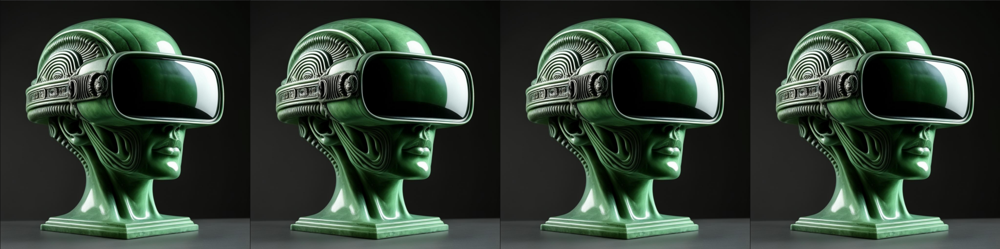

In [33]:
batch_size = 4
# url = "https://media.discordapp.net/attachments/1121232062708457508/1204613422680113212/1707272583_2.png?ex=65d55eac&is=65c2e9ac&hm=7741ea0f494b04c830128d883d7f03b28b5caffb85959d3fc0a0fb3d18d0411e&=&format=webp&quality=lossless"
url = "https://media.discordapp.net/attachments/1121232062708457508/1205134776206491648/image.png?ex=65d74438&is=65c4cf38&hm=fcb40fc6bbe437dee481afffcd94e25c5511d059341b2f2b6e046f157e6b9371&=&format=webp&quality=lossless"
images = resize_image(download_image(url)).unsqueeze(0).expand(batch_size, -1, -1, -1).to(device)

batch = {'images': images}

show_images(batch['images'])

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.01it/s]


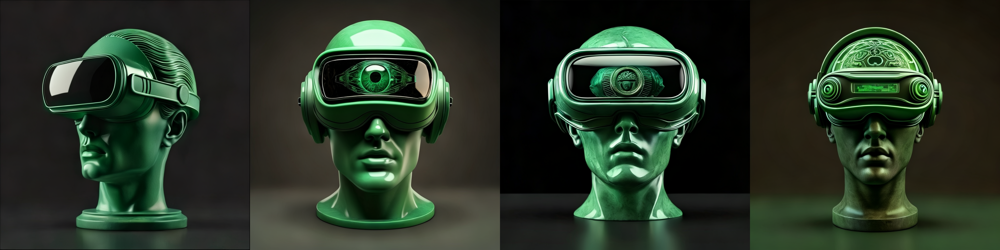

In [34]:
caption = ""
height, width = 1024, 1024
stage_c_latent_shape, stage_b_latent_shape = calculate_latent_sizes(height, width, batch_size=batch_size)

# Stage C Parameters
extras.sampling_configs['cfg'] = 4
extras.sampling_configs['shift'] = 2
extras.sampling_configs['timesteps'] = 20
extras.sampling_configs['t_start'] = 1.0

# Stage B Parameters
extras_b.sampling_configs['cfg'] = 1.1
extras_b.sampling_configs['shift'] = 1
extras_b.sampling_configs['timesteps'] = 10
extras_b.sampling_configs['t_start'] = 1.0

# PREPARE CONDITIONS
batch['captions'] = [caption] * batch_size

with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    # torch.manual_seed(42)
    conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False, eval_image_embeds=True)
    unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True, eval_image_embeds=False)    
    conditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=False)
    unconditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=True)

    sampling_c = extras.gdf.sample(
        models.generator, conditions, stage_c_latent_shape,
        unconditions, device=device, **extras.sampling_configs,
    )
    for (sampled_c, _, _) in tqdm(sampling_c, total=extras.sampling_configs['timesteps']):
        sampled_c = sampled_c
        
    # preview_c = models.previewer(sampled_c).float()
    # show_images(preview_c)

    conditions_b['effnet'] = sampled_c
    unconditions_b['effnet'] = torch.zeros_like(sampled_c)

    sampling_b = extras_b.gdf.sample(
        models_b.generator, conditions_b, stage_b_latent_shape,
        unconditions_b, device=device, **extras_b.sampling_configs
    )
    for (sampled_b, _, _) in tqdm(sampling_b, total=extras_b.sampling_configs['timesteps']):
        sampled_b = sampled_b
    sampled = models_b.stage_a.decode(sampled_b).float()

show_images(sampled)

## Image-to-Image

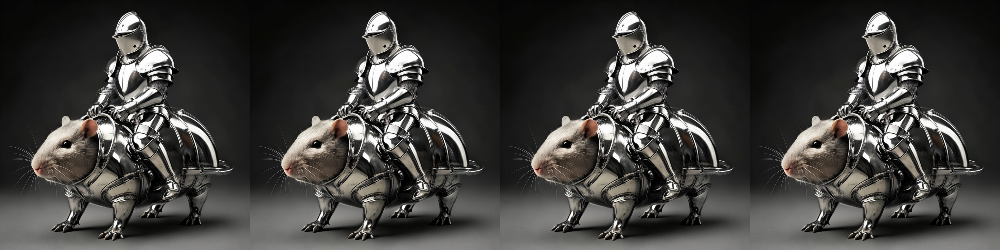

In [20]:
batch_size = 4
url = "https://media.discordapp.net/attachments/1121232062708457508/1204557773480656947/chrome_rodent_knight.png?ex=65d52ad8&is=65c2b5d8&hm=8e74f16e685e54a4f67337fedbdfea350169d03babc6c2f79fd1b74a6fb665fb&=&format=webp&quality=lossless"
images = resize_image(download_image(url)).unsqueeze(0).expand(batch_size, -1, -1, -1).to(device)

batch = {'images': images}

show_images(batch['images'])

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.01it/s]


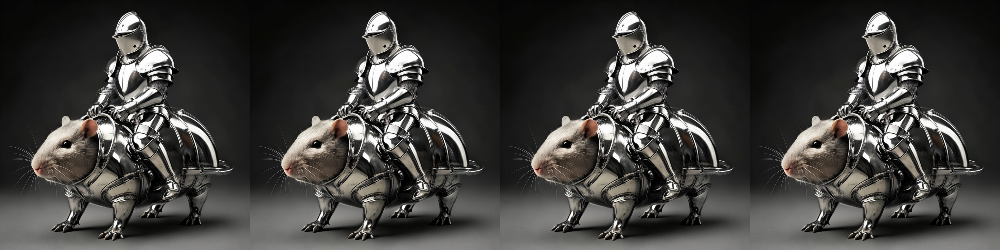

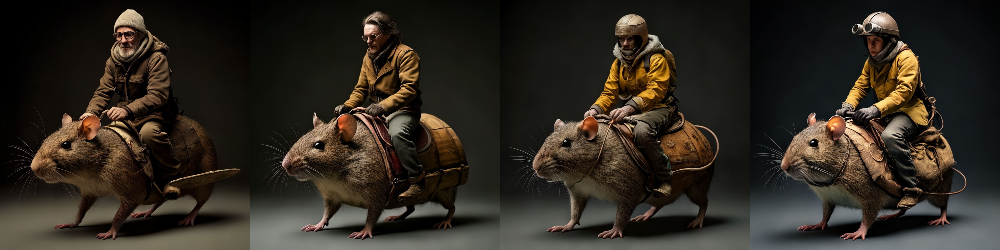

In [22]:
caption = "a person riding a rodent"
noise_level = 0.8
height, width = 1024, 1024
stage_c_latent_shape, stage_b_latent_shape = calculate_latent_sizes(height, width, batch_size=batch_size)

effnet_latents = core.encode_latents(batch, models, extras)
t = torch.ones(effnet_latents.size(0), device=device) * noise_level
noised = extras.gdf.diffuse(effnet_latents, t=t)[0]

# Stage C Parameters
extras.sampling_configs['cfg'] = 4
extras.sampling_configs['shift'] = 2
extras.sampling_configs['timesteps'] = int(20 * noise_level)
extras.sampling_configs['t_start'] = noise_level
extras.sampling_configs['x_init'] = noised

# Stage B Parameters
extras_b.sampling_configs['cfg'] = 1.1
extras_b.sampling_configs['shift'] = 1
extras_b.sampling_configs['timesteps'] = 10
extras_b.sampling_configs['t_start'] = 1.0

# PREPARE CONDITIONS
batch['captions'] = [caption] * batch_size

with torch.no_grad(), torch.cuda.amp.autocast(dtype=torch.bfloat16):
    # torch.manual_seed(42)
    conditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=False, eval_image_embeds=False)
    unconditions = core.get_conditions(batch, models, extras, is_eval=True, is_unconditional=True, eval_image_embeds=False)    
    conditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=False)
    unconditions_b = core_b.get_conditions(batch, models_b, extras_b, is_eval=True, is_unconditional=True)

    sampling_c = extras.gdf.sample(
        models.generator, conditions, stage_c_latent_shape,
        unconditions, device=device, **extras.sampling_configs,
    )
    for (sampled_c, _, _) in tqdm(sampling_c, total=extras.sampling_configs['timesteps']):
        sampled_c = sampled_c
        
    # preview_c = models.previewer(sampled_c).float()
    # show_images(preview_c)

    conditions_b['effnet'] = sampled_c
    unconditions_b['effnet'] = torch.zeros_like(sampled_c)

    sampling_b = extras_b.gdf.sample(
        models_b.generator, conditions_b, stage_b_latent_shape,
        unconditions_b, device=device, **extras_b.sampling_configs
    )
    for (sampled_b, _, _) in tqdm(sampling_b, total=extras_b.sampling_configs['timesteps']):
        sampled_b = sampled_b
    sampled = models_b.stage_a.decode(sampled_b).float()

show_images(batch['images'])
show_images(sampled)